<a href="https://colab.research.google.com/github/VARDHAN333DS/projects/blob/internship_projects/Cognifyz_intern.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd

In [3]:
from google.colab import files
uploaded = files.upload()

Saving Dataset .csv to Dataset .csv


In [6]:
import pandas as pd
df = pd.read_csv('Dataset .csv')

In [7]:
print(df.head())

   Restaurant ID         Restaurant Name  Country Code              City  \
0        6317637        Le Petit Souffle           162       Makati City   
1        6304287        Izakaya Kikufuji           162       Makati City   
2        6300002  Heat - Edsa Shangri-La           162  Mandaluyong City   
3        6318506                    Ooma           162  Mandaluyong City   
4        6314302             Sambo Kojin           162  Mandaluyong City   

                                             Address  \
0  Third Floor, Century City Mall, Kalayaan Avenu...   
1  Little Tokyo, 2277 Chino Roces Avenue, Legaspi...   
2  Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...   
3  Third Floor, Mega Fashion Hall, SM Megamall, O...   
4  Third Floor, Mega Atrium, SM Megamall, Ortigas...   

                                     Locality  \
0   Century City Mall, Poblacion, Makati City   
1  Little Tokyo, Legaspi Village, Makati City   
2  Edsa Shangri-La, Ortigas, Mandaluyong City   
3      SM 

In [8]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [9]:
print(df.isnull().sum())

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64


In [10]:
top_cuisines = df['Cuisines'].value_counts().head(3)
print(top_cuisines)

Cuisines
North Indian             936
North Indian, Chinese    511
Chinese                  354
Name: count, dtype: int64


In [11]:
total_restaurants = len(df)
percentages = (top_cuisines / total_restaurants) * 100
print(percentages)

Cuisines
North Indian             9.800021
North Indian, Chinese    5.350225
Chinese                  3.706418
Name: count, dtype: float64


In [12]:
city_counts = df['City'].value_counts()
print(city_counts.head(1))

City
New Delhi    5473
Name: count, dtype: int64


In [13]:
city_avg_rating = df.groupby('City')['Aggregate rating'].mean().sort_values(ascending=False)
print(city_avg_rating)

City
Inner City          4.900000
Quezon City         4.800000
Makati City         4.650000
Pasig City          4.633333
Mandaluyong City    4.625000
                      ...   
New Delhi           2.438845
Montville           2.400000
Mc Millan           2.400000
Noida               2.036204
Faridabad           1.866932
Name: Aggregate rating, Length: 141, dtype: float64


In [14]:
import matplotlib.pyplot as plt

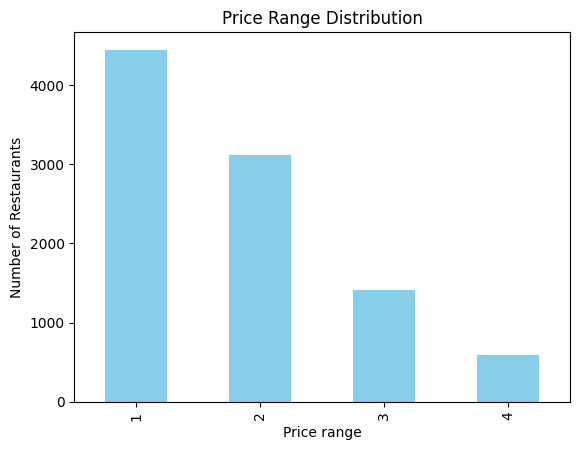

In [15]:
df['Price range'].value_counts().plot(kind='bar', color='skyblue')
plt.xlabel('Price range')
plt.ylabel('Number of Restaurants')
plt.title('Price Range Distribution')
plt.show()

In [16]:
delivery_ratings = df.groupby('Has Online delivery')['Aggregate rating'].mean()
print(delivery_ratings)

Has Online delivery
No     2.465296
Yes    3.248837
Name: Aggregate rating, dtype: float64


In [17]:
online_delivery = df['Has Online delivery'].value_counts(normalize=True) * 100
print(online_delivery)

Has Online delivery
No     74.337766
Yes    25.662234
Name: proportion, dtype: float64


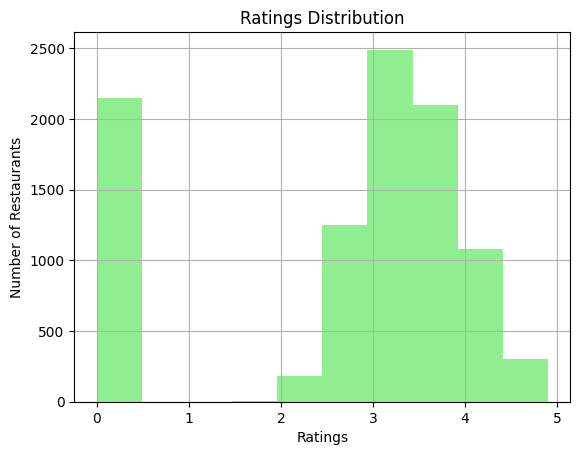

In [18]:
df['Aggregate rating'].hist(bins=10, color='lightgreen')
plt.xlabel('Ratings')
plt.ylabel('Number of Restaurants')
plt.title('Ratings Distribution')
plt.show()

In [19]:
average_votes = df['Votes'].mean()
print(f'Average Votes: {average_votes}')

Average Votes: 156.909747670401


In [20]:
df['Cuisine Combination'] = df['Cuisines'].str.split(', ')  # Assuming comma separation
df['Cuisine Combination'].explode().value_counts().head(5)

,count
Cuisine Combination,
North Indian,3960
Chinese,2735
Fast Food,1986
Mughlai,995
Italian,764


In [21]:
import folium

In [22]:
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=10)

In [23]:
for idx, row in df.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']], popup=row['Restaurant Name']).add_to(restaurant_map)

In [24]:
restaurant_map

In [25]:
from wordcloud import WordCloud

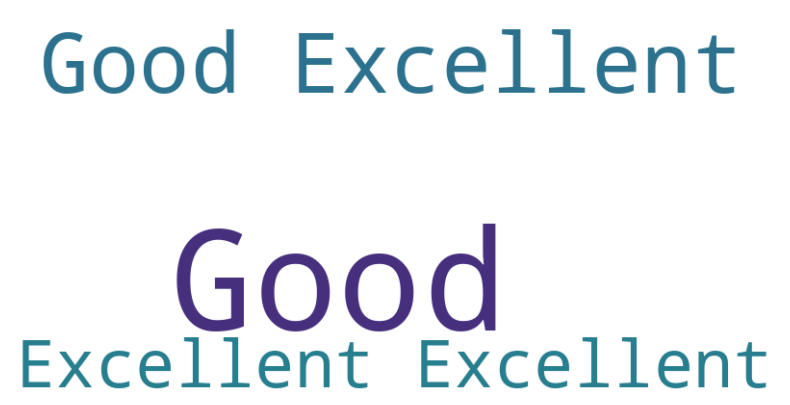

In [27]:
if 'Rating text' in df.columns and df['Rating text'].notnull().sum() > 0:
    # Filter positive reviews
    positive_reviews = " ".join(df[df['Aggregate rating'] >= 4]['Rating text'])

    # Generate word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(positive_reviews)

    # Display word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()
else:
    print("No review data available for word cloud.")

In [28]:
top_voted_restaurants = df.nlargest(5, 'Votes')[['Restaurant Name', 'Votes', 'Aggregate rating']]
print("Top 5 Restaurants by Votes:\n", top_voted_restaurants)

Top 5 Restaurants by Votes:
                 Restaurant Name  Votes  Aggregate rating
728                        Toit  10934               4.8
735                    Truffles   9667               4.7
3994           Hauz Khas Social   7931               4.3
2412                  Peter Cat   7574               4.3
739   AB's - Absolute Barbecues   6907               4.6


In [29]:
correlation = df[['Votes', 'Aggregate rating']].corr()
print("Correlation between Votes and Rating:\n", correlation)

Correlation between Votes and Rating:
                      Votes  Aggregate rating
Votes             1.000000          0.313691
Aggregate rating  0.313691          1.000000


In [30]:
import seaborn as sns

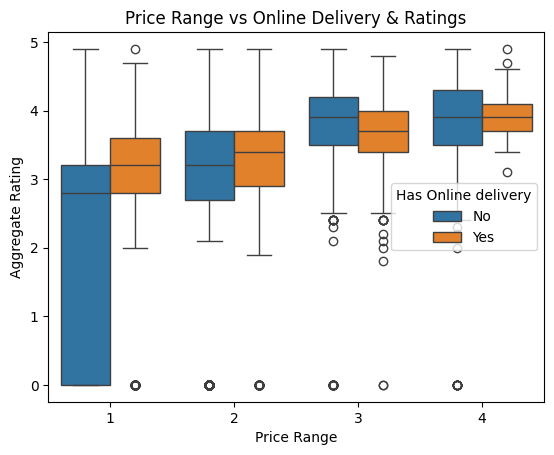

In [31]:
sns.boxplot(x=df['Price range'], y=df['Aggregate rating'], hue=df['Has Online delivery'])
plt.xlabel('Price Range')
plt.ylabel('Aggregate Rating')
plt.title('Price Range vs Online Delivery & Ratings')
plt.show()